# Naive v. Single Crosslink Multimer Comparison

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.colors as mcolors
import numpy as np
from scipy import stats
import sys

sys.path.insert(0, str(Path(__file__).resolve().parents[1]))
from config import REPO_ROOT, PROCESSED_DATA_DIR

In [ ]:
# ── Paths & column config ──────────────────────────────────────────────────────
CSV_WITHOUT = PROCESSED_DATA_DIR "03_naive_multimer_inter_xl_calculations.csv"
CSV_WITH    = [ PROCESSED_DATA_DIR / "05_xlrestraint_multimer_unconfident_A_OR_B.csv",
               PROCESSED_DATA_DIR / "06_xlrestraint_multimer_confident_A_AND_B.csv",
               PROCESSED_DATA_DIR / "07_xlrestraint_multimer_unconfident_A_AND_B.csv"]

COL_IPAE_WITHOUT   = "ipae_xl_window_mean_best_model"
COL_IPAE_WITH      = "ipae_xl_window_mean_best_model"
COL_DIST_WITHOUT   = "ipae_xl_window_mean_best_model_distance"
COL_DIST_WITH      = "ipae_xl_window_mean_best_model_distance"
DISTANCE_THRESHOLD = 35.0   # Å

WITHOUT rows: 7698  |  WITH rows: 6890
Matched crosslink pairs: 6804  (dropped 86 NaN/Inf rows)
Unique PPIs: 2286

── Plot 1: per-crosslink scatter ──
Saved → scatter_ipae_per_crosslink.png


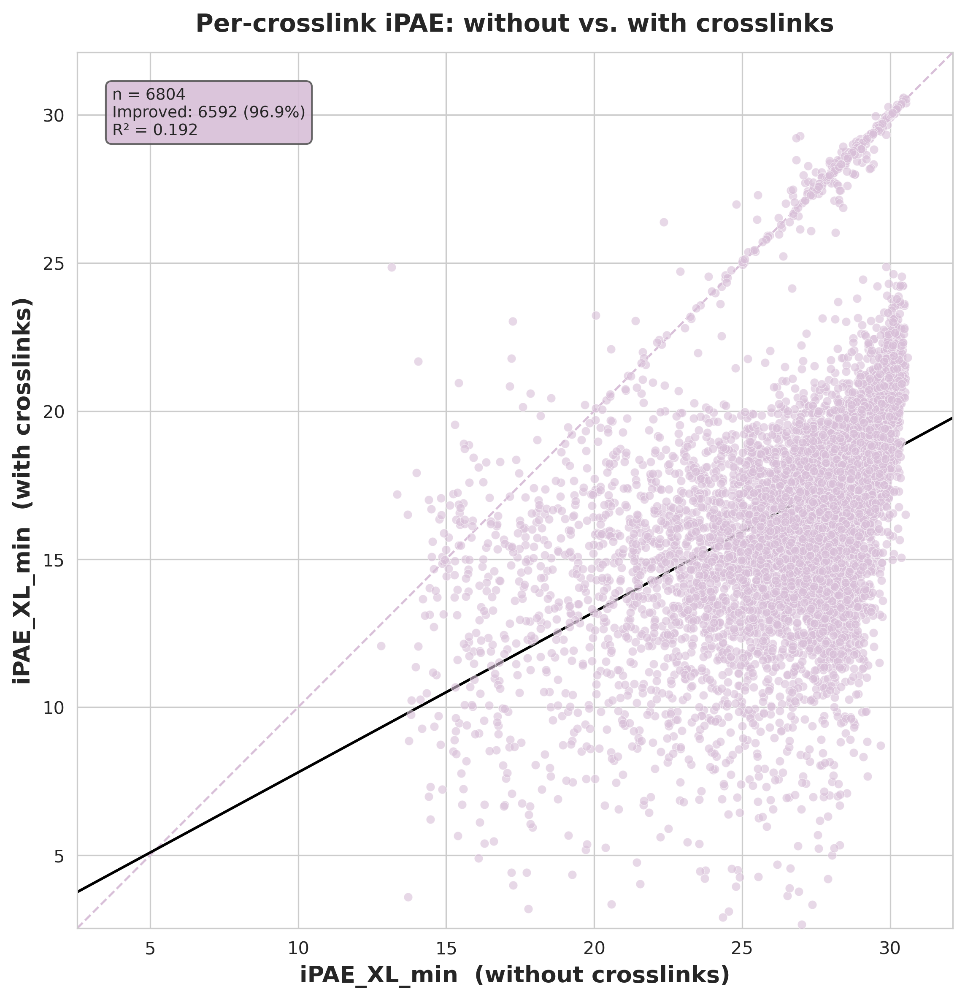


── Plot 2: PPI-level bubble ──


/tmp/ipykernel_3636462/366567387.py:149: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = fig.colorbar(sc, ax=ax, fraction=0.045, pad=0.03)


Saved → scatter_ipae_ppi_bubble.png


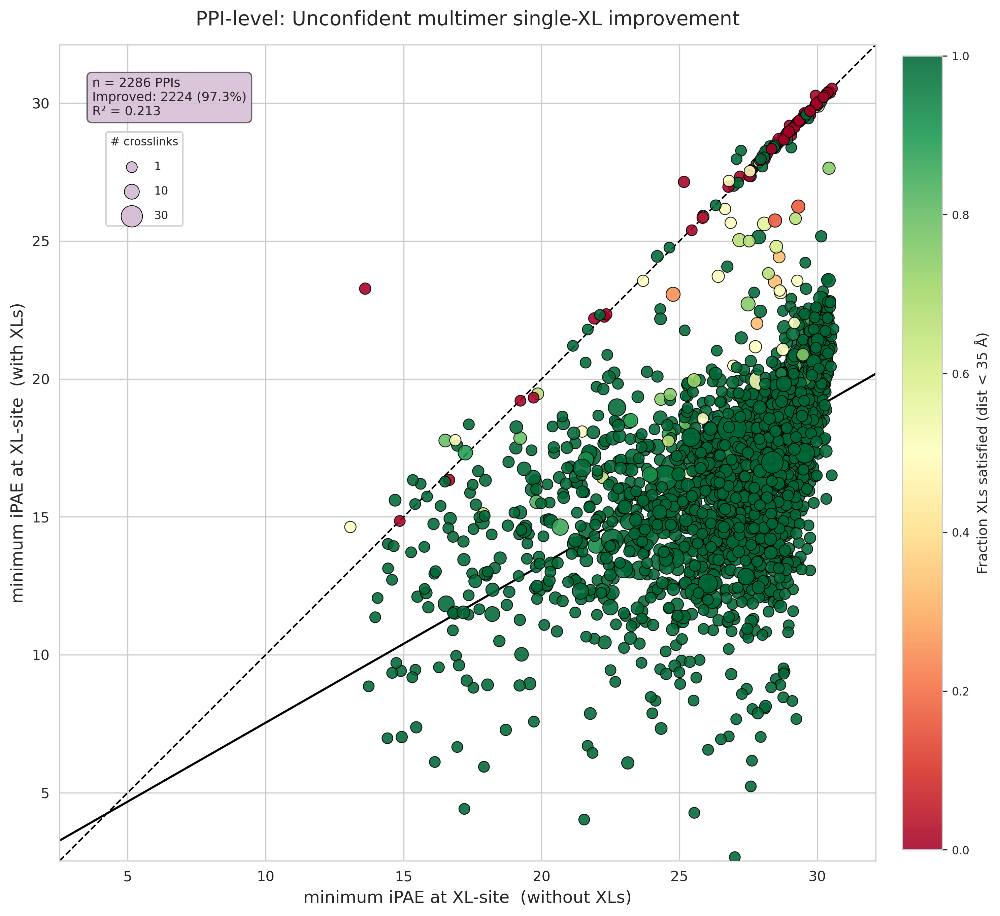


── Plot 2b: PPI-level bubble (thistle, no colorbar) ──
Saved → scatter_ipae_ppi_bubble_thistle.png


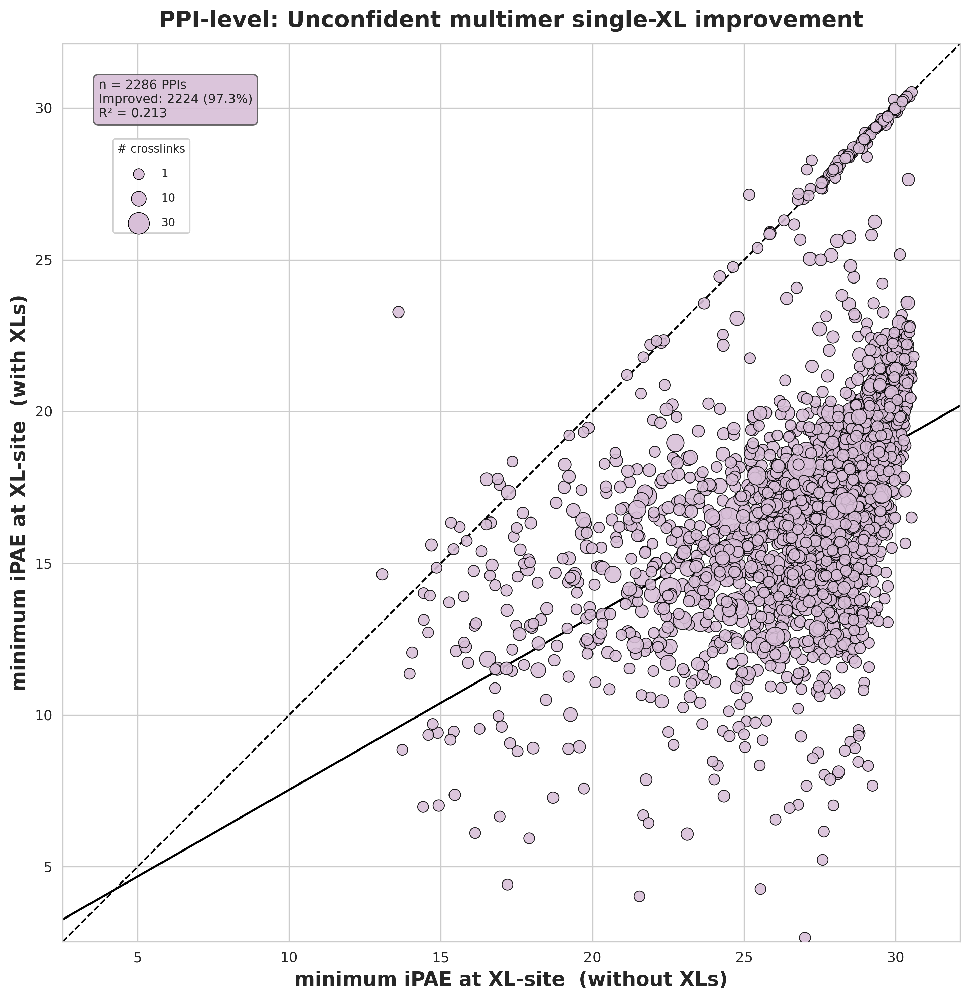


── Plot 3: paired violin / box ──
Saved → violin_ipae_comparison.png


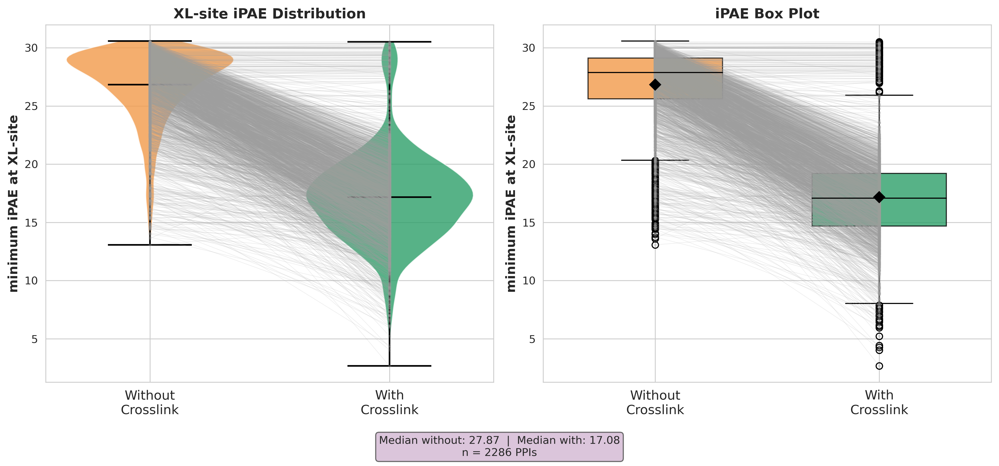


── Plot 4: distance scatter ──
Saved → scatter_distance_at_min_ipae.png


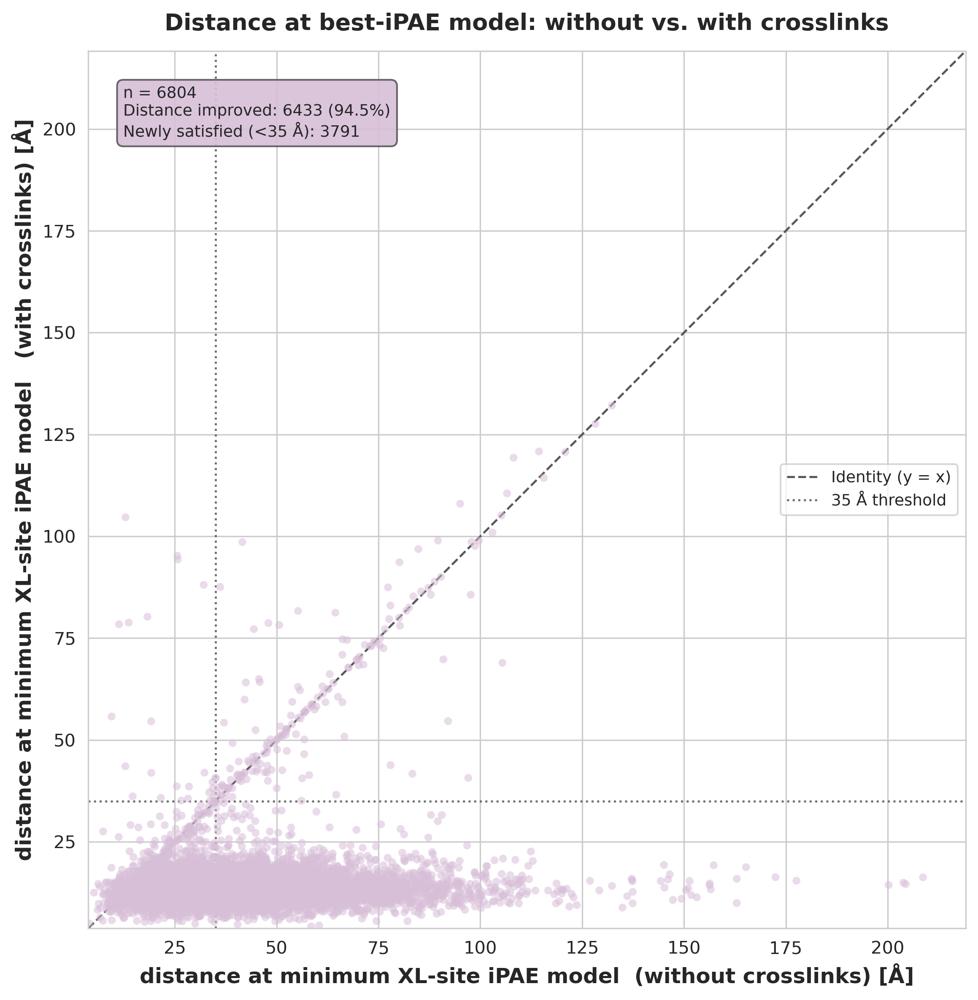


── Plot 5: distance heatmap ──
Saved → heatmap_crosslink_distances.png


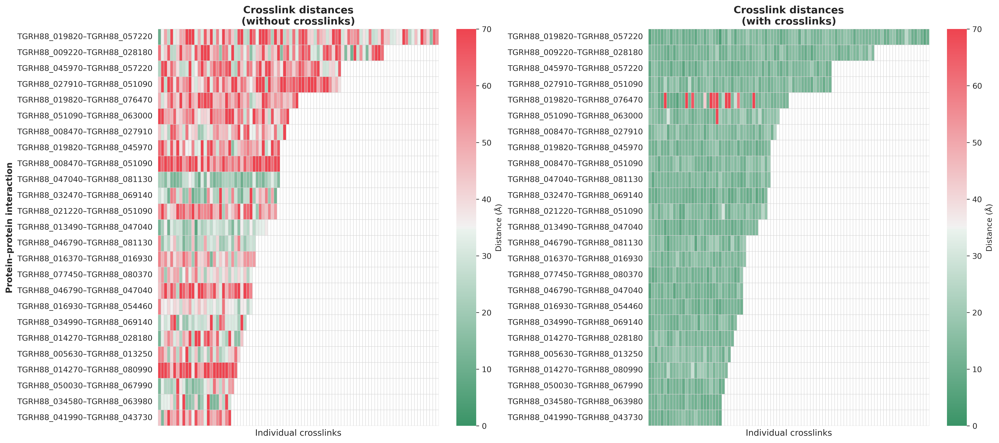


Done.
Index(['rank_monomer_confidence', 'Is Decoy', 'Protein A', 'Protein B',
       'Identification Score', 'Identification DeltaScore', '# CSMs',
       '# Crosslinks', 'Disambiguated Accessions A',
       'Disambiguated Accessions B', 'Local FDR', 'Crosslink Position A',
       'Crosslink Position B', 'Crosslinked Residue A',
       'Crosslinked Residue B', 'crosslink_multimer_confident',
       'crosslink_distance_in_range', 'monomer_pae_protein_A_strict',
       'monomer_pae_protein_B_strict', 'monomer_confident_A',
       'monomer_confident_B', 'monomer_confidence_tier',
       'monomer_pae_cutoff_angstrom', 'monomer_pae_mode',
       'monomer_aggregation', 'distance_mean', 'distance_std', 'distance_min',
       'distance_max', 'intra_pae_protein_a_mean', 'intra_pae_protein_b_mean',
       'ipae_interface_min_mean_across_models', 'iptm_mean',
       'iptm_chai_default_mean', 'ipae_interface_mean_best_model',
       'ipae_interface_mean_best_model_idx', 'ipae_contact_mean_best_mo

In [48]:
sns.set_style("whitegrid")
plt.rcParams['figure.dpi'] = 300

# ── Palette (thistle + neutrals) ────────────────────────────────────────────────
C_THISTLE   = "thistle"
C_DOT       = C_THISTLE     # scatter markers
C_WO        = "#F29A4A"     # without-crosslink violins/boxes
C_WI        = "#2D9F69"     # with-crosslink violins/boxes
C_REGR      = "black"       # regression, violin stats, box medians/means
C_IDENTITY  = "#595959"     # identity / threshold guides, stat-box edge
C_THRESH    = "#595959"     # distance cutoff lines
C_STATBOX   = C_THISTLE     # annotation box fill
C_CONNLINE  = "#9E9E9E"     # paired connecting lines

MERGE_KEYS = [
    "Protein A", "Protein B",
    "Crosslink Position A", "Crosslink Position B",
    "Crosslinked Residue A", "Crosslinked Residue B",
]
PPI_KEYS = ["Protein A", "Protein B"]

# Same metric columns in both CSVs (paths cell defines COL_*_WITHOUT / DISTANCE_THRESHOLD)
COL_IPAE = COL_IPAE_WITHOUT
COL_DIST = COL_DIST_WITHOUT
DIST_CUTOFF = DISTANCE_THRESHOLD


# ── Helpers ────────────────────────────────────────────────────────────────────

def load_data():
    df_wo = pd.read_csv(CSV_WITHOUT)
    df_wi = pd.concat([pd.read_csv(p) for p in CSV_WITH], ignore_index=True)
    df_wi = df_wi.drop_duplicates(subset=MERGE_KEYS, keep="first")
    print(f"WITHOUT rows: {len(df_wo)}  |  WITH rows: {len(df_wi)}")
    return df_wo, df_wi


def merge_crosslinks(df_wo, df_wi):
    """Inner join on the 6 crosslink key columns; drop NaN/Inf in metric cols."""
    merged = pd.merge(
        df_wo[MERGE_KEYS + [COL_IPAE, COL_DIST]],
        df_wi[MERGE_KEYS + [COL_IPAE, COL_DIST]],
        on=MERGE_KEYS,
        suffixes=("_without", "_with"),
    )
    before = len(merged)
    merged = merged.replace([np.inf, -np.inf], np.nan).dropna(
        subset=[f"{COL_IPAE}_without", f"{COL_IPAE}_with",
                f"{COL_DIST}_without", f"{COL_DIST}_with"]
    )
    print(f"Matched crosslink pairs: {len(merged)}  (dropped {before - len(merged)} NaN/Inf rows)")
    return merged


def aggregate_ppi(merged):
    """Aggregate matched crosslinks to PPI level."""
    merged = merged.copy()
    merged["xl_satisfied"] = merged[f"{COL_DIST}_with"] < DIST_CUTOFF
    ppi = merged.groupby(PPI_KEYS).agg(
        ipae_without = (f"{COL_IPAE}_without", "mean"),
        ipae_with    = (f"{COL_IPAE}_with",    "mean"),
        n_xl         = (f"{COL_IPAE}_with",    "count"),
        frac_sat     = ("xl_satisfied",        "mean"),
    ).reset_index()
    print(f"Unique PPIs: {len(ppi)}")
    return ppi, merged


def _statbox(ax, text):
    ax.text(0.04, 0.96, text, transform=ax.transAxes, fontsize=9, va="top",
            bbox=dict(boxstyle="round,pad=0.4", facecolor=C_STATBOX,
                      edgecolor=C_IDENTITY, alpha=0.9))


# ── Plot 1: per-crosslink scatter ──────────────────────────────────────────────

def plot_per_crosslink_scatter(merged, output_file="scatter_ipae_per_crosslink.png"):
    x = merged[f"{COL_IPAE}_without"].values
    y = merged[f"{COL_IPAE}_with"].values

    slope, intercept, r, p, _ = stats.linregress(x, y)
    r2 = r ** 2
    lim_min = min(x.min(), y.min()) * 0.95
    lim_max = max(x.max(), y.max()) * 1.05
    lx = np.array([lim_min, lim_max])

    fig, ax = plt.subplots(figsize=(8, 8))
    ax.scatter(x, y, s=25, alpha=0.6, color=C_DOT,
               edgecolors="white", linewidths=0.3, zorder=3)
    ax.plot(lx, lx,                     lw=1.2, ls="--", color=C_DOT,
            label="Identity (y = x)", zorder=2)
    ax.plot(lx, slope * lx + intercept, lw=1.5, color=C_REGR,
            label=f"Regression  R²={r2:.3f}", zorder=2)

    ax.set_xlim(lim_min, lim_max); ax.set_ylim(lim_min, lim_max)
    ax.set_aspect("equal")
    ax.set_xlabel("iPAE_XL_min  (without crosslinks)", fontsize=13, fontweight="bold")
    ax.set_ylabel("iPAE_XL_min  (with crosslinks)",    fontsize=13, fontweight="bold")
    ax.set_title("Per-crosslink iPAE: without vs. with crosslinks",
                 fontsize=14, fontweight="bold", pad=12)

    n_improved = (y < x).sum()
    _, p_wil = stats.wilcoxon(x, y)
    _statbox(ax, (f"n = {len(x)}\n"
                  f"Improved: {n_improved} ({100*n_improved/len(x):.1f}%)\n"
                  f"R² = {r2:.3f}"))
    # ax.legend(fontsize=9, framealpha=0.75)

    plt.tight_layout()
    plt.savefig(output_file, dpi=300, bbox_inches="tight")
    print(f"Saved → {output_file}")
    plt.show()


# ── Plot 2: PPI-level bubble scatter ──────────────────────────────────────────

def plot_ppi_bubble(ppi, output_file="scatter_ipae_ppi_bubble.png"):
    norm = mcolors.Normalize(vmin=0, vmax=1)

    n = ppi["n_xl"].values
    size_min, size_max = 60, 600
    s = size_min + (n - n.min()) / max(n.max() - n.min(), 1) * (size_max - size_min)

    xp = ppi["ipae_without"].values
    yp = ppi["ipae_with"].values
    lim_min = min(xp.min(), yp.min()) * 0.95
    lim_max = max(xp.max(), yp.max()) * 1.05
    lx = np.array([lim_min, lim_max])
    sp, ip, rp, pp, _ = stats.linregress(xp, yp)

    n_improved = (yp < xp).sum()
    _, p_wil = stats.wilcoxon(xp, yp)

    fig, ax = plt.subplots(figsize=(10, 10))
    sc = ax.scatter(xp, yp, s=s, c=ppi["frac_sat"], cmap="RdYlGn", norm=norm,
                    edgecolors="black", linewidths=0.6, alpha=0.88, zorder=3)
    ax.plot(lx, lx,            lw=1.2, ls="--", color="black",
            label="Identity (y = x)", zorder=2)
    ax.plot(lx, sp * lx + ip,  lw=1.5, color="black",
            label=f"Regression  R²={rp**2:.3f}", zorder=2)

    ax.set_xlim(lim_min, lim_max); ax.set_ylim(lim_min, lim_max)
    ax.set_aspect("equal")
    ax.set_xlabel("minimum iPAE at XL-site  (without XLs)", fontsize=12)
    ax.set_ylabel("minimum iPAE at XL-site  (with XLs)",    fontsize=12)
    ax.set_title("PPI-level: Unconfident multimer single-XL improvement",
                 fontsize=14, pad=14)

    cbar = fig.colorbar(sc, ax=ax, fraction=0.045, pad=0.03)
    cbar.set_label(f"Fraction XLs satisfied (dist < {DIST_CUTOFF:.0f} Å)", fontsize=10)
    cbar.ax.tick_params(labelsize=8)

    # size legend
    size_vals = sorted(set(np.percentile(n, [0, 33, 66, 100]).astype(int)))
    # size_vals = list(dict.fromkeys(size_vals))
    size_vals = [1, 10, 30]

    handles = [plt.scatter([], [],
                           s=size_min + (v - n.min()) / max(n.max() - n.min(), 1) * (size_max - size_min),
                           c=C_THISTLE, edgecolors="black", linewidths=0.5, label=str(v))
               for v in size_vals]
    leg1 = ax.legend(handles=handles, title="# crosslinks", fontsize=8,
                     title_fontsize=8, loc="upper left", framealpha=0.75, labelspacing=1.2, handletextpad=1.0, bbox_to_anchor=(0.05, 0.9), borderaxespad=0.5)
    ax.add_artist(leg1)
    
    # ax.legend(fontsize=8, framealpha=0.75, loc="upper left", labelcolor = "0.5")

    _statbox(ax, (f"n = {len(ppi)} PPIs\n"
                  f"Improved: {n_improved} ({100*n_improved/len(ppi):.1f}%)\n"
                  f"R² = {rp**2:.3f}"))

    plt.tight_layout()
    plt.savefig(output_file, dpi=300, bbox_inches="tight")
    print(f"Saved → {output_file}")
    plt.show()


def plot_ppi_bubble_plain(ppi, output_file="scatter_ipae_ppi_bubble_thistle.png", facecolor=C_THISTLE):
    """Same geometry as PPI bubble scatter, single fill color, no frac_sat colorbar."""
    n = ppi["n_xl"].values
    size_min, size_max = 60, 600
    s = size_min + (n - n.min()) / max(n.max() - n.min(), 1) * (size_max - size_min)

    xp = ppi["ipae_without"].values
    yp = ppi["ipae_with"].values
    lim_min = min(xp.min(), yp.min()) * 0.95
    lim_max = max(xp.max(), yp.max()) * 1.05
    lx = np.array([lim_min, lim_max])
    sp, ip, rp, pp, _ = stats.linregress(xp, yp)

    n_improved = (yp < xp).sum()
    _, p_wil = stats.wilcoxon(xp, yp)

    fig, ax = plt.subplots(figsize=(10, 10))
    ax.scatter(xp, yp, s=s, c=facecolor, edgecolors="black", linewidths=0.6, alpha=0.88, zorder=3)
    ax.plot(lx, lx,            lw=1.2, ls="--", color="black",
            label="Identity (y = x)", zorder=2)
    ax.plot(lx, sp * lx + ip,  lw=1.5, color="black",
            label=f"Regression  R²={rp**2:.3f}", zorder=2)

    ax.set_xlim(lim_min, lim_max); ax.set_ylim(lim_min, lim_max)
    ax.set_aspect("equal")
    ax.set_xlabel("minimum iPAE at XL-site  (without XLs)", fontsize=14, fontweight="bold")
    ax.set_ylabel("minimum iPAE at XL-site  (with XLs)",    fontsize=14, fontweight="bold")
    ax.set_title("PPI-level: Unconfident multimer single-XL improvement",
                 fontsize=16, pad=12, fontweight="bold")

    size_vals = [1, 10, 30]
    handles = [plt.scatter([], [],
                           s=size_min + (v - n.min()) / max(n.max() - n.min(), 1) * (size_max - size_min),
                           c=facecolor, edgecolors="black", linewidths=0.5, label=str(v))
               for v in size_vals]
    leg1 = ax.legend(handles=handles, title="# crosslinks", fontsize=8,
                     title_fontsize=8, loc="upper left", framealpha=0.75, labelspacing=1.2, handletextpad=1.0, bbox_to_anchor=(0.05, 0.9), borderaxespad=0.5)
    ax.add_artist(leg1)

    _statbox(ax, (f"n = {len(ppi)} PPIs\n"
                  f"Improved: {n_improved} ({100*n_improved/len(ppi):.1f}%)\n"
                  f"R² = {rp**2:.3f}"))

    plt.tight_layout()
    plt.savefig(output_file, dpi=300, bbox_inches="tight")
    print(f"Saved → {output_file}")
    plt.show()




# ── Plot 3: paired violin + box ────────────────────────────────────────────────

def plot_paired_violin(ppi, output_file="violin_ipae_comparison.png"):
    x = ppi["ipae_without"].values
    y = ppi["ipae_with"].values
    _, p_wil = stats.wilcoxon(x, y)
    accent_grey = "#5A5A5A"  # means, medians, whiskers, caps, violin extrema

    colors = [C_WO, C_WI]
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 6))

    # violin
    parts = ax1.violinplot([x, y], positions=[0, 1], showmeans=True,
                            showextrema=True, widths=0.7)
    for i, pc in enumerate(parts["bodies"]):
        pc.set_facecolor(colors[i]); pc.set_alpha(0.80)
    for key in ("cmeans", "cmaxes", "cmins", "cbars"):
        if key in parts:
            parts[key].set_color(C_REGR)
    for i in range(len(ppi)):
        ax1.plot([0, 1], [x[i], y[i]], "o-", color="#9E9E9E",
                 alpha=0.18, markersize=2, linewidth=0.5)
    ax1.set_xticks([0, 1])
    ax1.set_xticklabels(["Without\nCrosslink", "With\nCrosslink"], fontsize=12)
    ax1.set_ylabel("minimum iPAE at XL-site", fontsize=12, fontweight="bold")
    ax1.set_title("XL-site iPAE Distribution", fontsize=13, fontweight="bold")

    # box
    bp = ax2.boxplot([x, y], positions=[0, 1], widths=0.6, patch_artist=True,
                     showmeans=True,
                     meanprops=dict(marker="D", markerfacecolor=C_REGR,
                                    markeredgecolor=C_REGR, markersize=7))
    for patch, color in zip(bp["boxes"], colors):
        patch.set_facecolor(color); patch.set_alpha(0.80)
    for element in ("whiskers", "caps", "medians"):
        for line in bp[element]:
            line.set_color(C_REGR)
    for i in range(len(ppi)):
        ax2.plot([0, 1], [x[i], y[i]], "o-", color="#9E9E9E",
                 alpha=0.18, markersize=2, linewidth=0.5)
    ax2.set_xticks([0, 1])
    ax2.set_xticklabels(["Without\nCrosslink", "With\nCrosslink"], fontsize=12)
    ax2.set_ylabel("minimum iPAE at XL-site", fontsize=12, fontweight="bold")
    ax2.set_title("iPAE Box Plot", fontsize=13, fontweight="bold")

    textstr = (f"Median without: {np.median(x):.2f}  |  Median with: {np.median(y):.2f}\n"
               f"n = {len(ppi)} PPIs")
    fig.text(0.5, 0.01, textstr, ha="center", fontsize=10,
             bbox=dict(boxstyle="round", facecolor=C_STATBOX,
                       edgecolor=C_IDENTITY, alpha=0.9))

    plt.tight_layout(rect=[0, 0.07, 1, 1])
    plt.savefig(output_file, dpi=300, bbox_inches="tight")
    print(f"Saved → {output_file}")
    plt.show()


# ── Plot 4: distance scatter ───────────────────────────────────────────────────

def plot_distance_scatter(merged, output_file="scatter_distance_at_min_ipae.png"):
    x = merged[f"{COL_DIST}_without"].values
    y = merged[f"{COL_DIST}_with"].values
    lim_min = min(x.min(), y.min()) * 0.95
    lim_max = max(x.max(), y.max()) * 1.05
    lx = np.array([lim_min, lim_max])

    fig, ax = plt.subplots(figsize=(8, 8))
    ax.scatter(x, y, s=20, alpha=0.55, color=C_DOT, edgecolors="none", zorder=3)
    ax.plot(lx, lx, lw=1.2, ls="--", color=C_IDENTITY,
            label="Identity (y = x)", zorder=2)
    ax.axhline(DIST_CUTOFF, color=C_THRESH, lw=1.2, ls=":",
               alpha=0.85, label=f"{DIST_CUTOFF:.0f} Å threshold")
    ax.axvline(DIST_CUTOFF, color=C_THRESH, lw=1.2, ls=":", alpha=0.85)
    ax.set_aspect("equal")
    ax.set_xlim(lim_min, lim_max); ax.set_ylim(lim_min, lim_max)
    ax.set_xlabel("distance at minimum XL-site iPAE model  (without crosslinks) [Å]", fontsize=12, fontweight="bold")
    ax.set_ylabel("distance at minimum XL-site iPAE model   (with crosslinks) [Å]",    fontsize=12, fontweight="bold")
    ax.set_title("Distance at best-iPAE model: without vs. with crosslinks",
                 fontsize=13, fontweight="bold", pad=12)

    n_improved  = (y < x).sum()
    n_newly_sat = ((y < DIST_CUTOFF) & (x >= DIST_CUTOFF)).sum()
    _statbox(ax, (f"n = {len(x)}\n"
                  f"Distance improved: {n_improved} ({100*n_improved/len(x):.1f}%)\n"
                  f"Newly satisfied (<{DIST_CUTOFF:.0f} Å): {n_newly_sat}"))
    ax.legend(fontsize=9, framealpha=0.75)

    plt.tight_layout()
    plt.savefig(output_file, dpi=300, bbox_inches="tight")
    print(f"Saved → {output_file}")
    plt.show()


# ── Plot 5: heatmap ────────────────────────────────────────────────────────────

def plot_crosslink_heatmap(merged, max_ppis=50, output_file="heatmap_crosslink_distances.png"):
    ppi_counts = (merged.groupby(PPI_KEYS)
                        .size()
                        .sort_values(ascending=False)
                        .head(max_ppis))
    top_ppis = ppi_counts.index.tolist()

    rows_wo, rows_wi, labels = [], [], []
    for pA, pB in top_ppis:
        sub = merged[(merged["Protein A"] == pA) & (merged["Protein B"] == pB)]
        rows_wo.append(sub[f"{COL_DIST}_without"].values)
        rows_wi.append(sub[f"{COL_DIST}_with"].values)
        # labels.append(f"{pA[:12]}–{pB[:12]}")
        labels.append(f"{pA}–{pB}")

    max_len = max(len(r) for r in rows_wo)
    mat_wo  = np.full((len(rows_wo), max_len), np.nan)
    mat_wi  = np.full((len(rows_wi), max_len), np.nan)
    for i, (rw, ri) in enumerate(zip(rows_wo, rows_wi)):
        mat_wo[i, :len(rw)] = rw
        mat_wi[i, :len(ri)] = ri

    fig_h = max(8, len(labels) * 0.28)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, fig_h))

    cmap_heat = sns.diverging_palette(145, 10, s=80, l=55, as_cmap=True)
    kw = dict(cmap=cmap_heat, center=DIST_CUTOFF, vmin=0, vmax=70,
              cbar_kws={"label": "Distance (Å)"}, yticklabels=labels,
              xticklabels=False, linewidths=0.4, linecolor="lightgray")
    sns.heatmap(mat_wo, ax=ax1, **kw)
    sns.heatmap(mat_wi, ax=ax2, **kw)

    ax1.set_title("Crosslink distances\n(without crosslinks)", fontsize=13, fontweight="bold")
    ax2.set_title("Crosslink distances\n(with crosslinks)",    fontsize=13, fontweight="bold")
    ax1.set_ylabel("Protein–protein interaction", fontsize=11, fontweight="bold")
    ax1.set_xlabel("Individual crosslinks", fontsize=11)
    ax2.set_xlabel("Individual crosslinks", fontsize=11)

    plt.tight_layout()
    plt.savefig(output_file, dpi=300, bbox_inches="tight")
    print(f"Saved → {output_file}")
    plt.show()


# ── Main ───────────────────────────────────────────────────────────────────────

if __name__ == "__main__":
    df_wo, df_wi = load_data()
    merged       = merge_crosslinks(df_wo, df_wi)
    ppi, merged  = aggregate_ppi(merged)

    print("\n── Plot 1: per-crosslink scatter ──")
    plot_per_crosslink_scatter(merged)

    print("\n── Plot 2: PPI-level bubble ──")
    plot_ppi_bubble(ppi)

    print("\n── Plot 2b: PPI-level bubble (thistle, no colorbar) ──")
    plot_ppi_bubble_plain(ppi)

    print("\n── Plot 3: paired violin / box ──")
    plot_paired_violin(ppi)

    print("\n── Plot 4: distance scatter ──")
    plot_distance_scatter(merged)

    print("\n── Plot 5: distance heatmap ──")
    plot_crosslink_heatmap(merged, max_ppis=25)

    print("\nDone.")

    print(df_wi.columns)

## Ranking by lowest iPAE in XL model & max improvement

In [20]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

COL_IPAE_W = f"{COL_IPAE}_with"
COL_IPAE_O = f"{COL_IPAE}_without"
COL_DIST_W = f"{COL_DIST}_with"
COL_DIST_O = f"{COL_DIST}_without"


def ppi_ranking_scores(merged, ppi_keys=None):
    """Per (Protein A, Protein B): min iPAE with, and max (iPAE_without - iPAE_with)."""
    if ppi_keys is None:
        ppi_keys = PPI_KEYS
    g = merged.groupby(ppi_keys, sort=False)
    min_with = g[COL_IPAE_W].min()
    # Positive = improved structure (lower iPAE on WITH run) for that crosslink
    delta = merged[COL_IPAE_O] - merged[COL_IPAE_W]
    max_drop = merged.assign(_delta=delta).groupby(ppi_keys, sort=False)["_delta"].max()
    return min_with, max_drop


def plot_crosslink_heatmap_ranked(
    merged,
    max_ppis=50,
    rank_by="min_ipae_with",  # "min_ipae_with" | "max_ipae_improvement" | "n_crosslinks"
    ascending=None,
    output_file="heatmap_crosslink_distances_ranked.png",
    ppi_keys=None,
):
    """
    rank_by:
      - min_ipae_with: PPIs with the smallest min(COL_IPAE_WITH) first (best iPAE first).
      - max_ipae_improvement: PPIs with the largest max(COL_IPAE_WITHOUT - COL_IPAE_WITH) first.
      - n_crosslinks: same as original notebook (count of rows per PPI, descending).
    """
    if ppi_keys is None:
        ppi_keys = PPI_KEYS

    min_with, max_drop = ppi_ranking_scores(merged, ppi_keys)

    if rank_by == "min_ipae_with":
        order = min_with.sort_values(ascending=True if ascending is None else ascending)
    elif rank_by == "max_ipae_improvement":
        order = max_drop.sort_values(ascending=False if ascending is None else ascending)
    elif rank_by == "n_crosslinks":
        order = merged.groupby(ppi_keys).size().sort_values(ascending=False)
    else:
        raise ValueError(rank_by)

    top_ppis = order.head(max_ppis).index.tolist()

    rows_wo, rows_wi, labels = [], [], []
    for pA, pB in top_ppis:
        sub = merged[(merged["Protein A"] == pA) & (merged["Protein B"] == pB)]
        # Optional: order crosslinks within each PPI (e.g. by residue position)
        # sub = sub.sort_values(["Crosslink Position A", "Crosslink Position B"])
        rows_wo.append(sub[COL_DIST_O].values)
        rows_wi.append(sub[COL_DIST_W].values)
        labels.append(f"{pA}–{pB}")

    max_len = max(len(r) for r in rows_wo)
    mat_wo = np.full((len(rows_wo), max_len), np.nan)
    mat_wi = np.full((len(rows_wi), max_len), np.nan)
    for i, (rw, ri) in enumerate(zip(rows_wo, rows_wi)):
        mat_wo[i, : len(rw)] = rw
        mat_wi[i, : len(ri)] = ri

    fig_h = max(8, len(labels) * 0.28)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, fig_h))

    cmap_heat = sns.diverging_palette(145, 10, s=80, l=55, as_cmap=True)
    kw = dict(
        cmap=cmap_heat,
        center=DIST_CUTOFF,
        vmin=0,
        vmax=70,
        cbar_kws={"label": "Distance (Å)"},
        yticklabels=labels,
        xticklabels=False,
        linewidths=0.4,
        linecolor="lightgray",
    )
    sns.heatmap(mat_wo, ax=ax1, **kw)
    sns.heatmap(mat_wi, ax=ax2, **kw)

    ax1.set_title("Crosslink distances\n(without crosslinks)", fontsize=13, fontweight="bold")
    ax2.set_title("Crosslink distances\n(with crosslinks)", fontsize=13, fontweight="bold")
    ax1.set_ylabel("Protein–protein interaction", fontsize=11, fontweight="bold")
    ax1.set_xlabel("Individual crosslinks", fontsize=11)
    ax2.set_xlabel("Individual crosslinks", fontsize=11)
    fig.suptitle(f"PPI order: {rank_by}", fontsize=12, y=1.01)

    plt.tight_layout()
    plt.savefig(output_file, dpi=300, bbox_inches="tight")
    print(f"Saved → {output_file}")
    plt.show()

Saved → heatmap_crosslink_distances_ranked_min_ipae_with.png


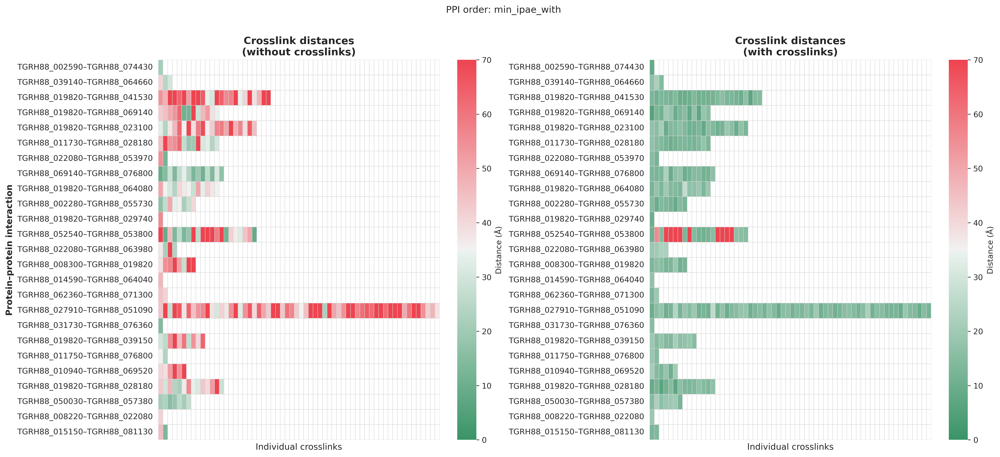

Saved → heatmap_crosslink_distances_ranked_max_ipae_improvement.png


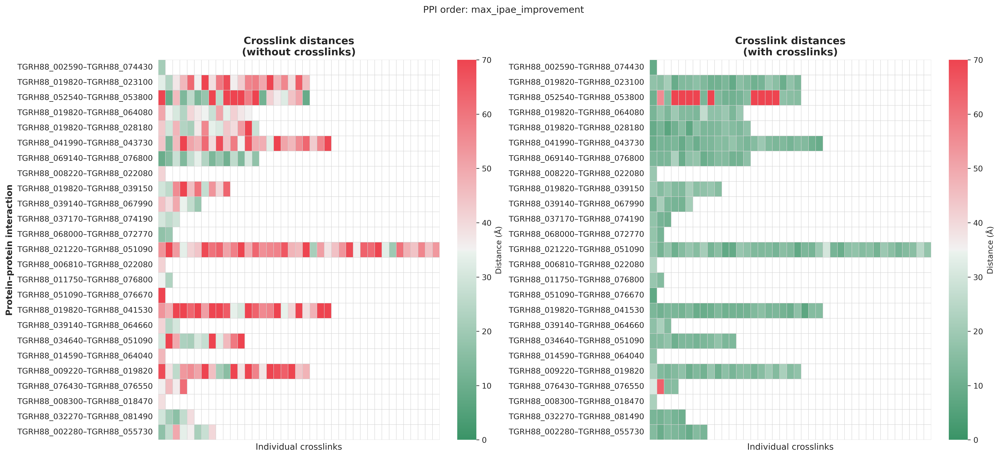

In [9]:
# After df_wo, df_wi = load_data(); merged = merge_crosslinks(...); etc.

plot_crosslink_heatmap_ranked(
    merged,
    max_ppis=25,
    rank_by="min_ipae_with",
    output_file="heatmap_crosslink_distances_ranked_min_ipae_with.png",
)

plot_crosslink_heatmap_ranked(
    merged,
    max_ppis=25,
    rank_by="max_ipae_improvement",
    output_file="heatmap_crosslink_distances_ranked_max_ipae_improvement.png",
)

# Export ranked heatmap

In [30]:
COL_IPAE_W = f"{COL_IPAE}_with"
COL_IPAE_O = f"{COL_IPAE}_without"

g = merged.groupby(PPI_KEYS, sort=False)
rank_df = (
    g.agg(
        n_crosslinks=(COL_IPAE_W, "count"),
        min_ipae_with=(COL_IPAE_W, "min"),
        max_ipae_improvement=(COL_IPAE_O, lambda s: (merged.loc[s.index, COL_IPAE_O] - merged.loc[s.index, COL_IPAE_W]).max()),
    )
    .reset_index()
)

m = merged.copy()
m["_ipae_improvement"] = m[f"{COL_IPAE}_without"] - m[f"{COL_IPAE}_with"]

rank_df = (
    m.groupby(PPI_KEYS, sort=False)
    .agg(
        n_crosslinks=(f"{COL_IPAE}_with", "count"),
        min_ipae_with=(f"{COL_IPAE}_with", "min"),
        max_ipae_improvement=("_ipae_improvement", "max"),
    )
    .reset_index()
)

rank_by = "min_ipae_with"  # or "max_ipae_improvement" / "n_crosslinks"

if rank_by == "min_ipae_with":
    ordered = rank_df.sort_values("min_ipae_with", ascending=True)
elif rank_by == "max_ipae_improvement":
    ordered = rank_df.sort_values("max_ipae_improvement", ascending=False)
else:
    ordered = rank_df.sort_values("n_crosslinks", ascending=False)

ordered = ordered.head(25).copy()  # same max_ppis as heatmap
ordered.insert(0, "heatmap_rank", range(1, len(ordered) + 1))


ordered.to_csv("heatmap_ppi_ranking_unconf_multi_conf_A_AND_B_mono.csv", index=False)